In [1]:
from collections import defaultdict
import itertools
import json
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import sklearn

import ihop
from ihop.community2vec import GensimCommunity2Vec
import ihop.clustering as ic


In [2]:

DATA_ROOT = Path("../data")
C2V_ROOT = DATA_ROOT / "community2vec"
VIZ_PATH = DATA_ROOT / "community2vec_nearest_neighbor_visuals"

if not VIZ_PATH.exists():
    VIZ_PATH.mkdir()

MONTHS = sorted(["2021-04", "2021-05", "2021-06", "2021-07", "2021-08", "2021-09", "2021-10", "2021-11", "2021-12", "2022-01", "2022-02", "2022-03"
])

C2V_MODELS = [GensimCommunity2Vec.load(C2V_ROOT / f"RC_{m}"/"best_model") for m in MONTHS]

SUBREDDIT_COUNTS_CSVS = [C2V_ROOT / f"RC_{m}" / "subreddit_counts.csv" for m in MONTHS]

# Nearest Neighbors of Subreddits over time 

In order to build the community2vec models, we kept the top 10K subreddits in each month by number of comments posted. In the community2vec model of a given month, you can retrieve the set of any number of nearest neighbors for a particular subreddit, then compare how that set changes from one month to the next. The change in sets of nearest neighbors can be measured using the [Jaccard Index](https://en.wikipedia.org/wiki/Jaccard_index) of the top subreddits between each month. Let $S_1$ and $S_2$ be the top 10K subreddits for months 1 and 2 respectively, then the similarity and diversity of top subreddits between those months is $\frac{|S_1 \cap S_2|}{|S_1 \cup S_2|}$.
The closer to 1 the values are, the more similar the nearest neighbors are between those two months. 

10 nearest neightbors of r/trans


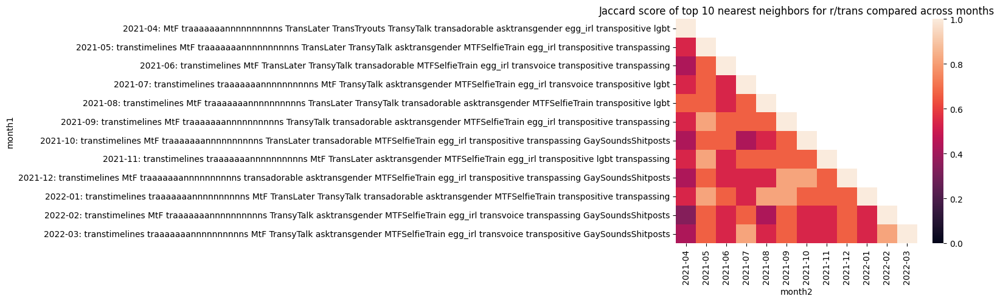

10 nearest neightbors of r/antiwork


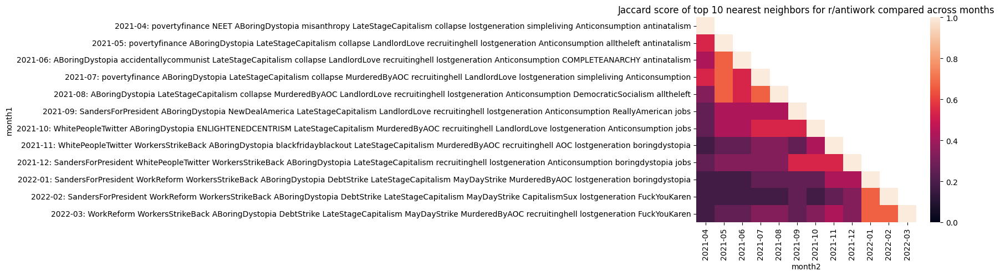

10 nearest neightbors of r/WorkReform


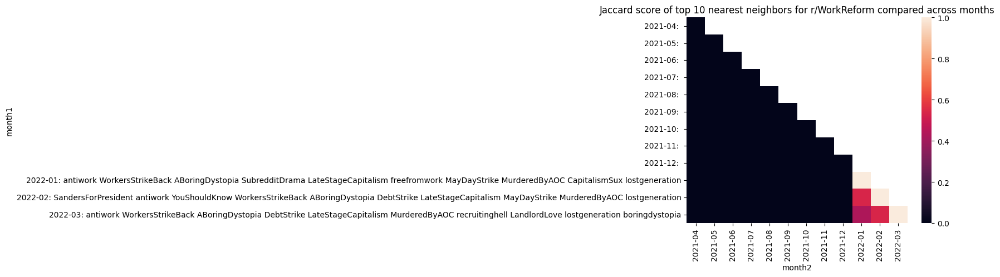

10 nearest neightbors of r/AskReddit


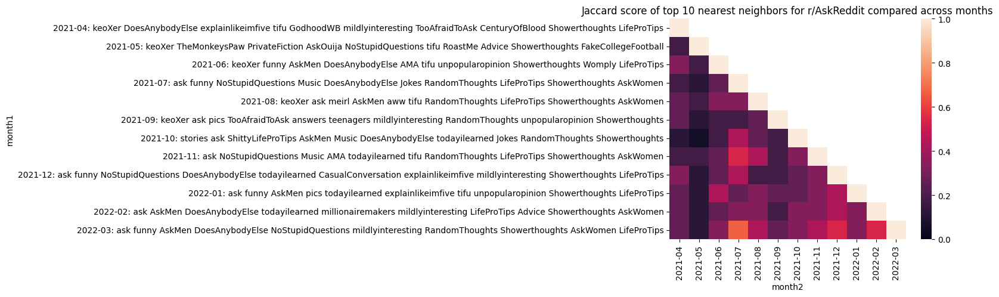

10 nearest neightbors of r/IdiotsInCars


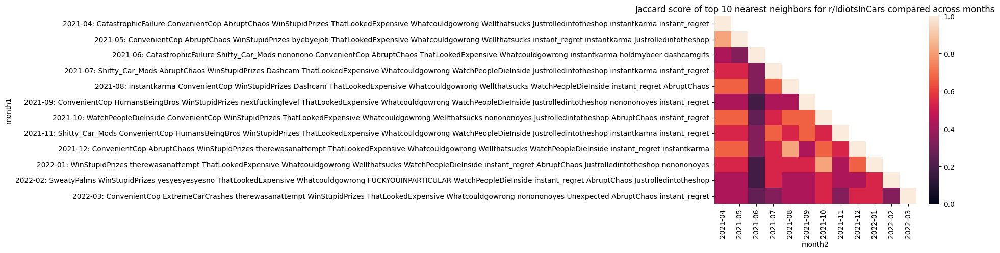

10 nearest neightbors of r/wallstreetbets


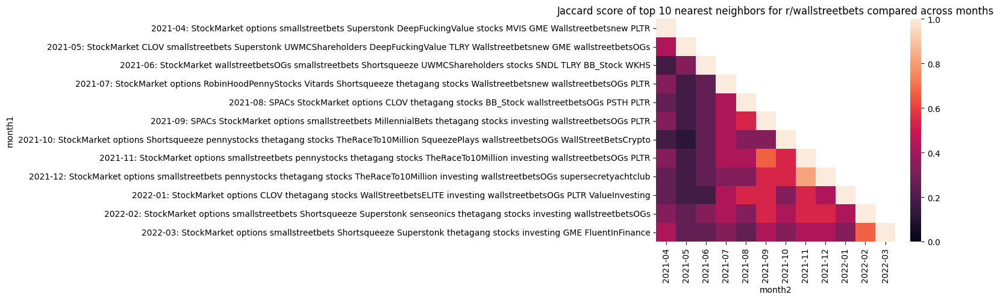

10 nearest neightbors of r/vaxxhappened


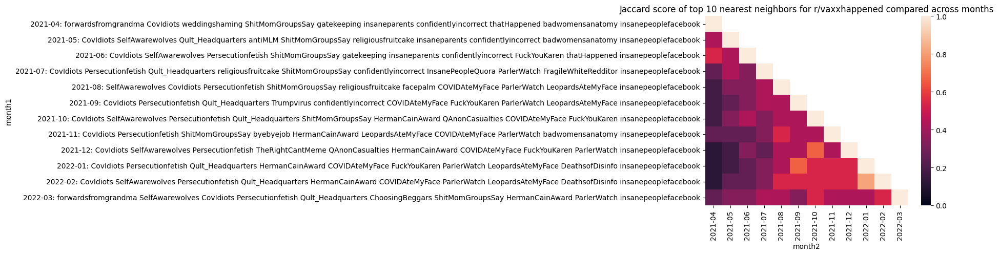

10 nearest neightbors of r/PublicFreakout


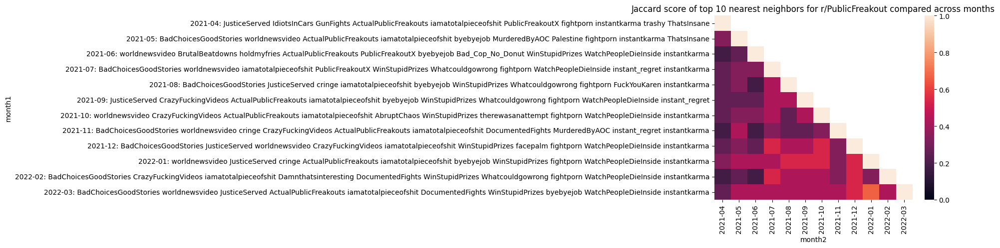

10 nearest neightbors of r/ActualPublicFreakouts


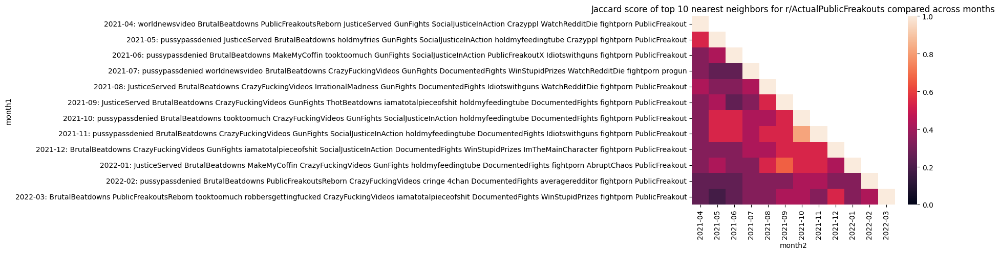

10 nearest neightbors of r/TheRedPill


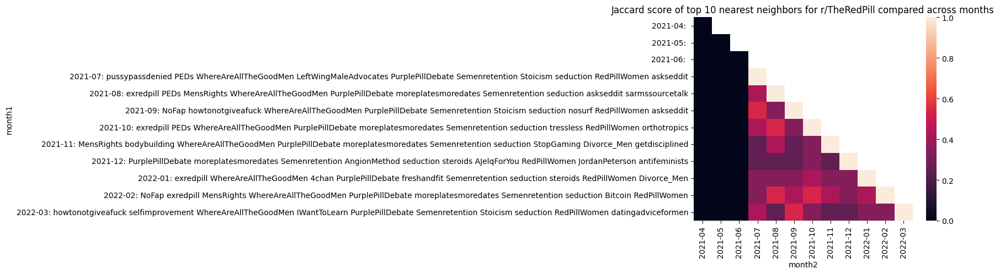

10 nearest neightbors of r/dating_advice


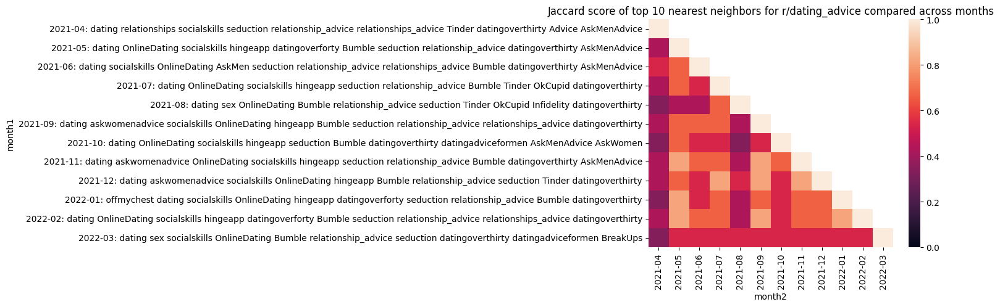

10 nearest neightbors of r/democrats


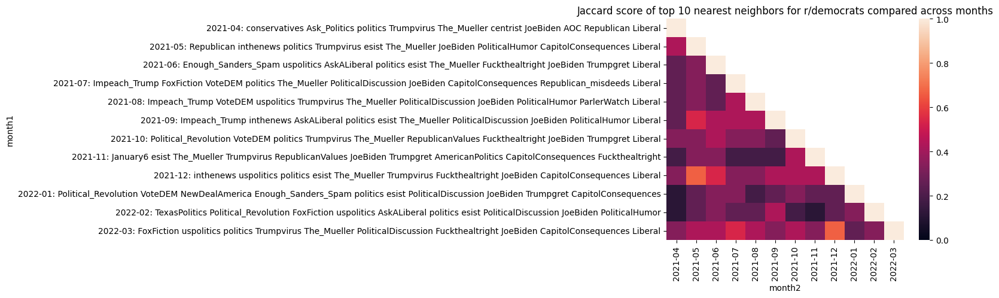

10 nearest neightbors of r/Conservative


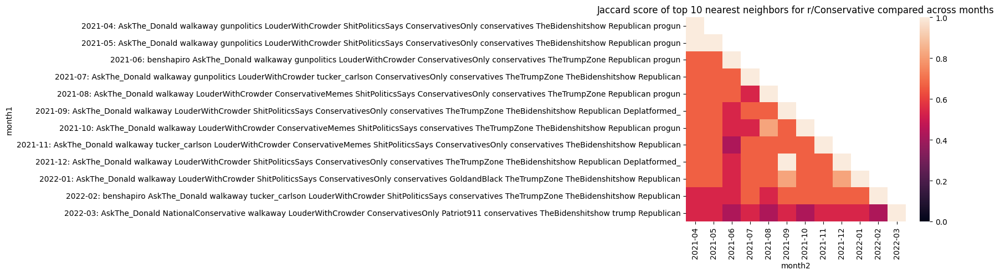

10 nearest neightbors of r/conservatives


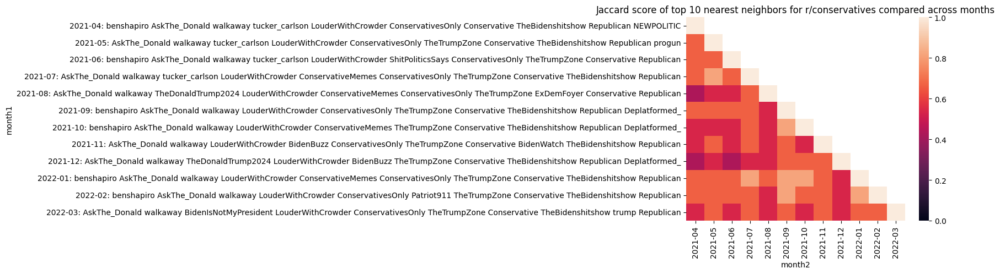

10 nearest neightbors of r/AskThe_Donald


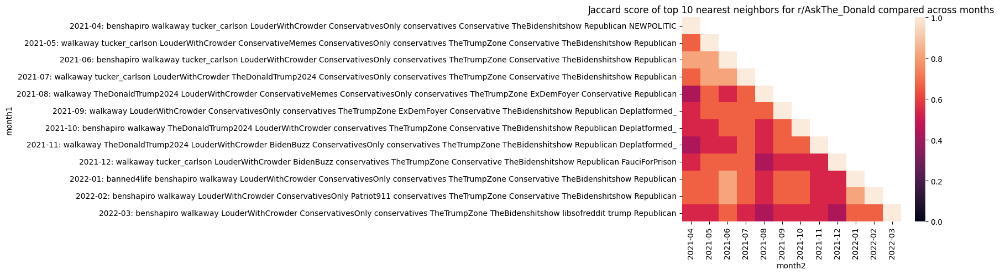

10 nearest neightbors of r/running


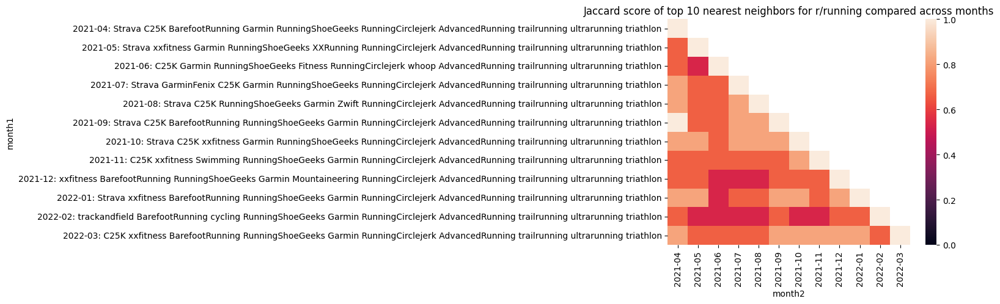

10 nearest neightbors of r/teenagers


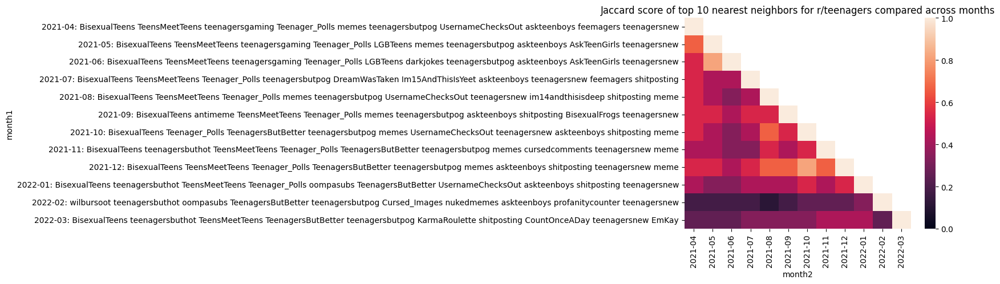

10 nearest neightbors of r/LeopardsAteMyFace


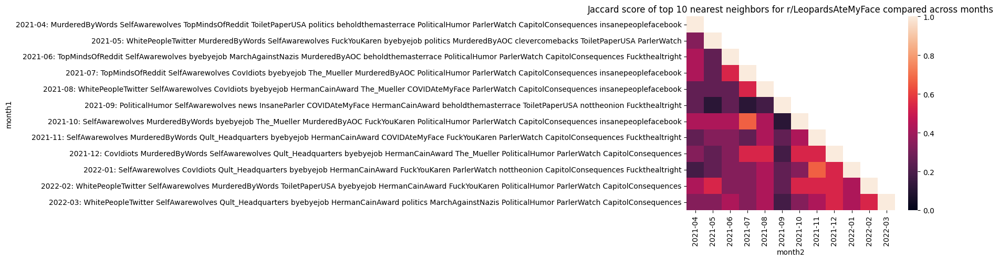

10 nearest neightbors of r/GME


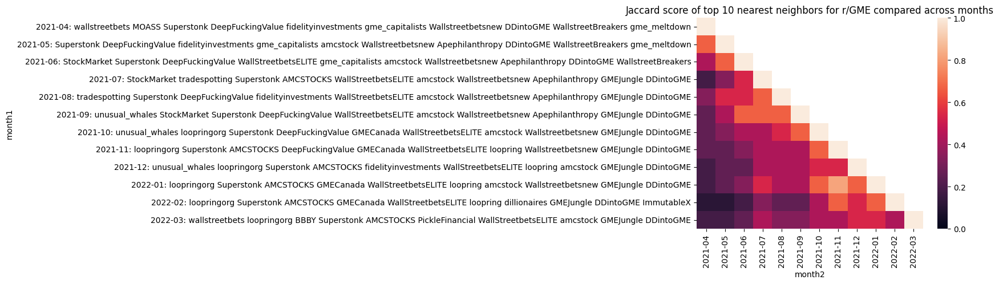

20 nearest neightbors of r/trans


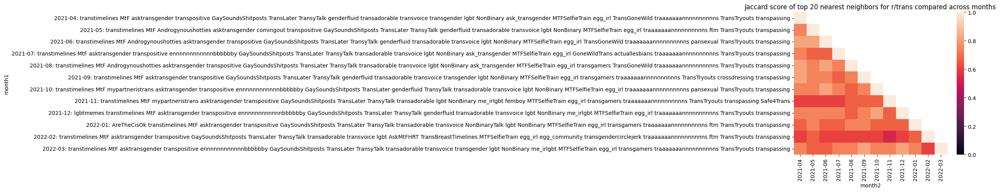

20 nearest neightbors of r/antiwork


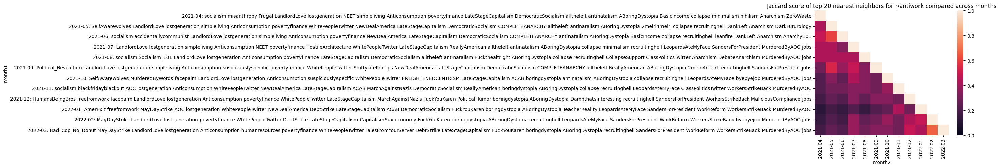

20 nearest neightbors of r/WorkReform


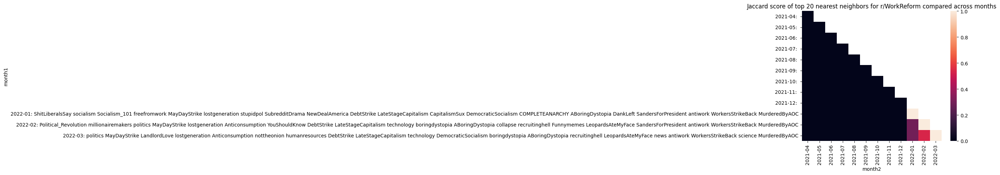

20 nearest neightbors of r/AskReddit


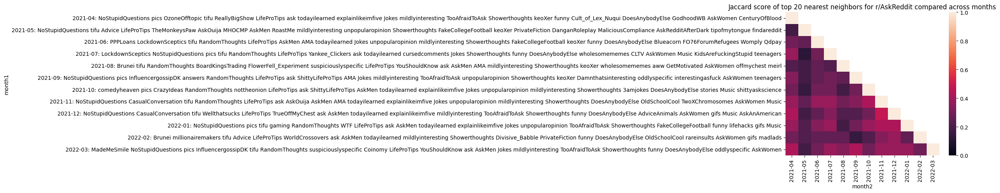

20 nearest neightbors of r/IdiotsInCars


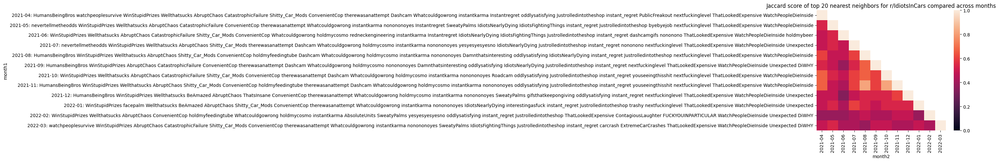

20 nearest neightbors of r/wallstreetbets


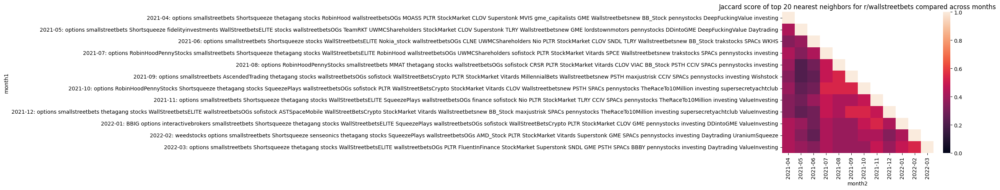

20 nearest neightbors of r/vaxxhappened


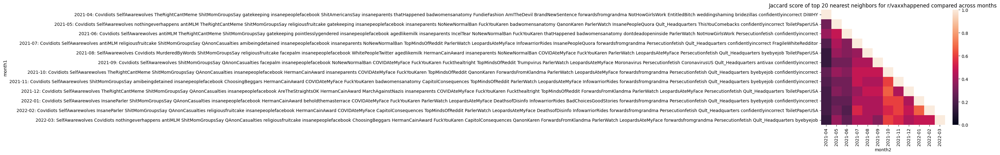

20 nearest neightbors of r/PublicFreakout


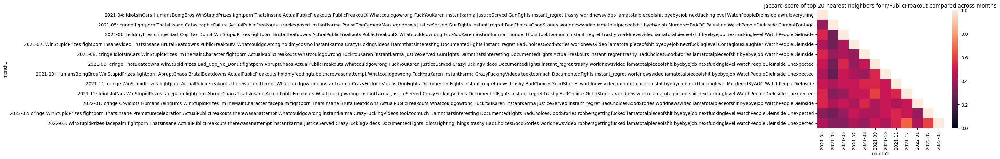

20 nearest neightbors of r/ActualPublicFreakouts


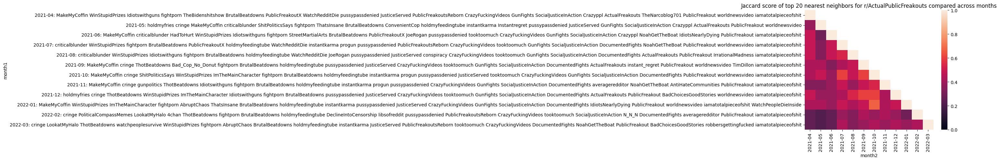

20 nearest neightbors of r/TheRedPill


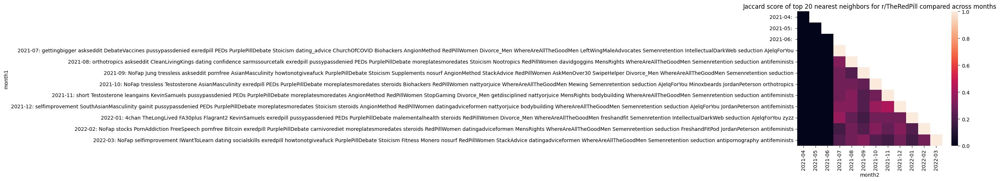

20 nearest neightbors of r/dating_advice


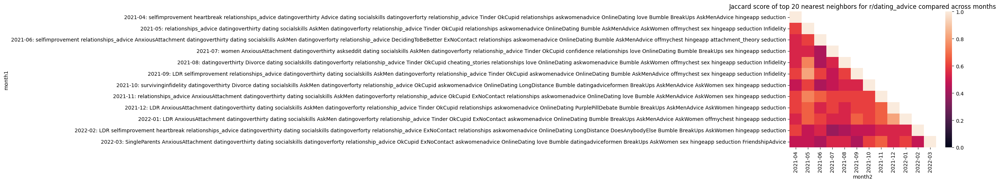

20 nearest neightbors of r/democrats


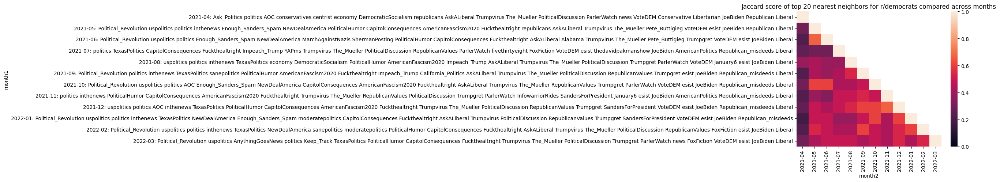

20 nearest neightbors of r/Conservative


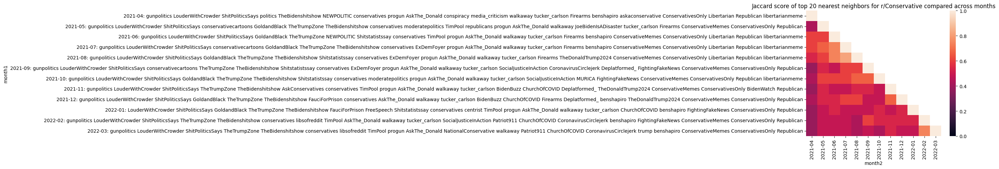

20 nearest neightbors of r/conservatives


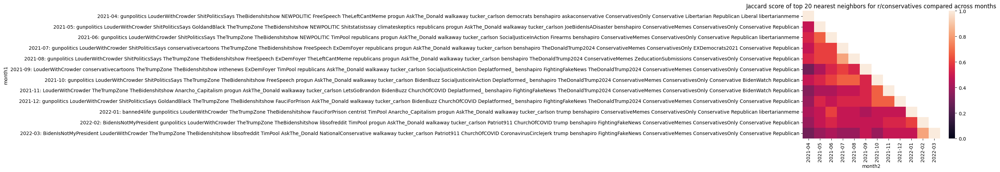

20 nearest neightbors of r/AskThe_Donald


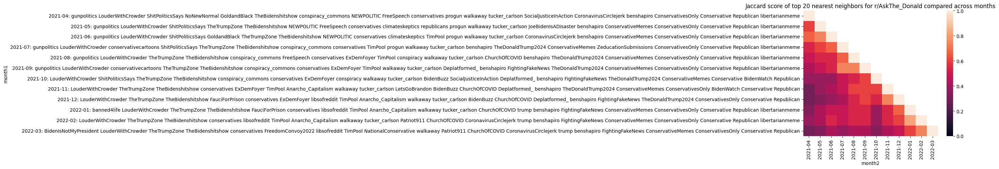

20 nearest neightbors of r/running


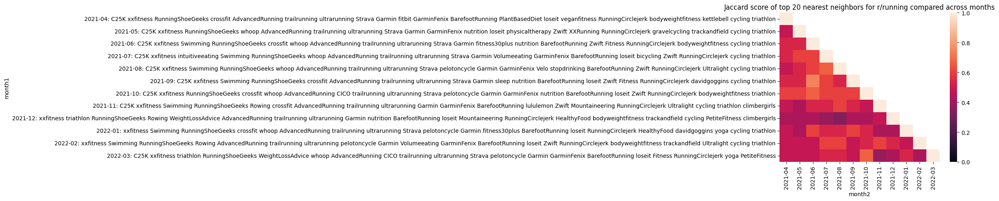

20 nearest neightbors of r/teenagers


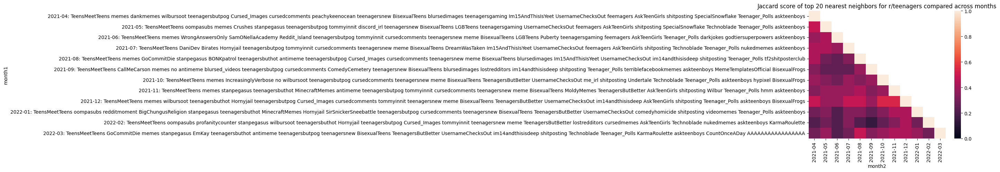

20 nearest neightbors of r/LeopardsAteMyFace


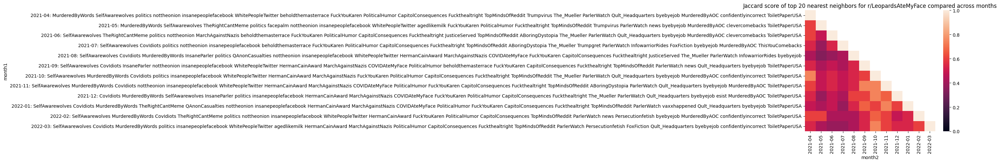

20 nearest neightbors of r/GME


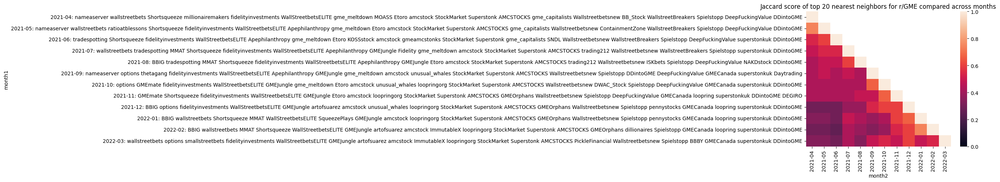

30 nearest neightbors of r/trans


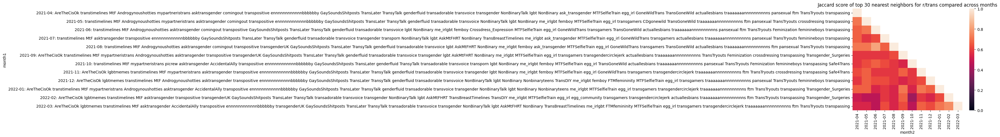

30 nearest neightbors of r/antiwork


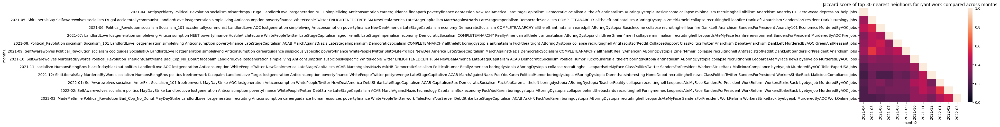

30 nearest neightbors of r/WorkReform


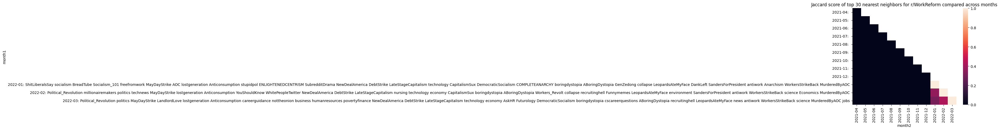

30 nearest neightbors of r/AskReddit


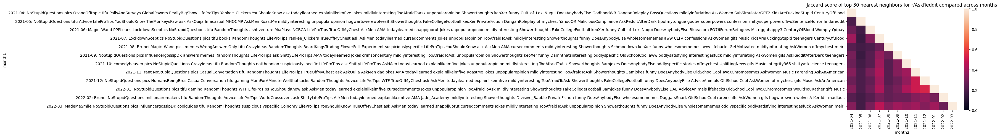

30 nearest neightbors of r/IdiotsInCars


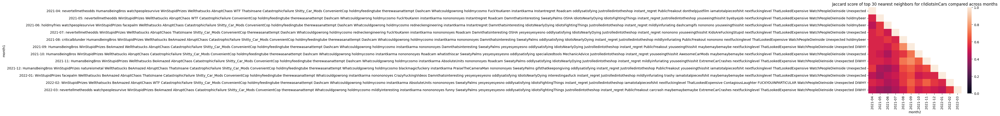

30 nearest neightbors of r/wallstreetbets


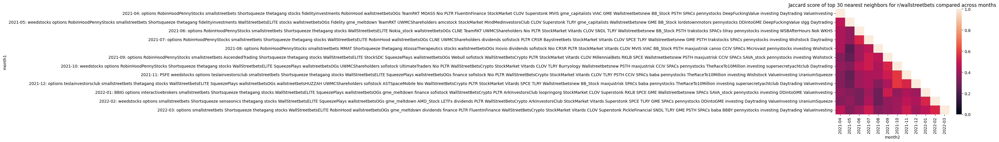

30 nearest neightbors of r/vaxxhappened


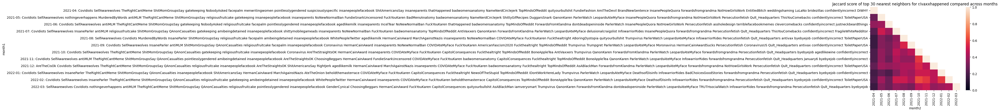

30 nearest neightbors of r/PublicFreakout


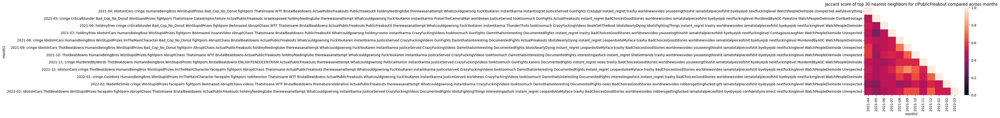

30 nearest neightbors of r/ActualPublicFreakouts


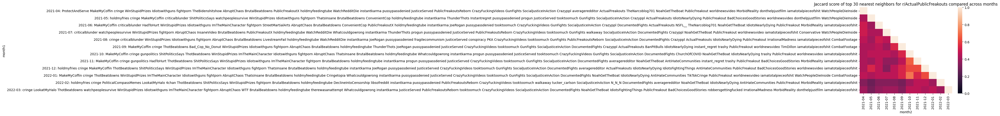

30 nearest neightbors of r/TheRedPill


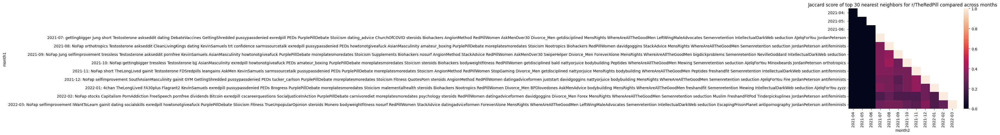

30 nearest neightbors of r/dating_advice


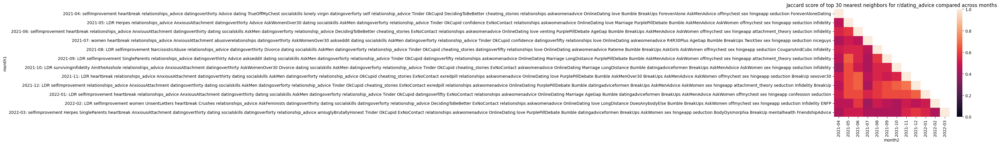

30 nearest neightbors of r/democrats


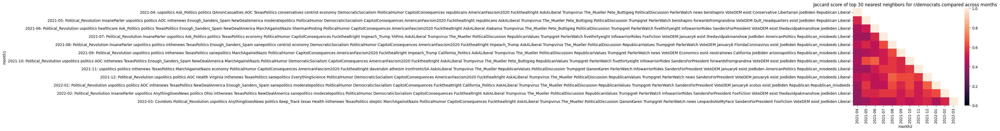

30 nearest neightbors of r/Conservative


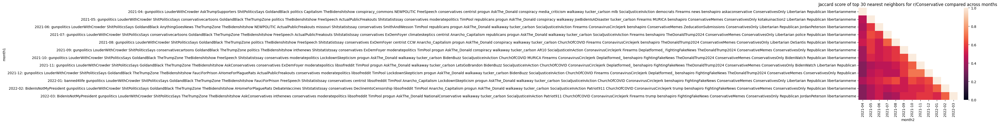

30 nearest neightbors of r/conservatives


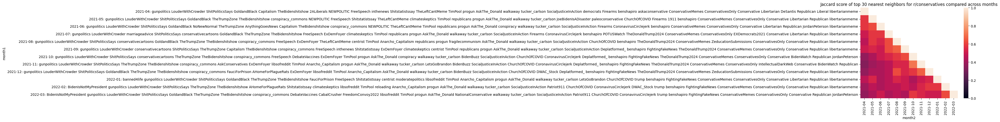

30 nearest neightbors of r/AskThe_Donald


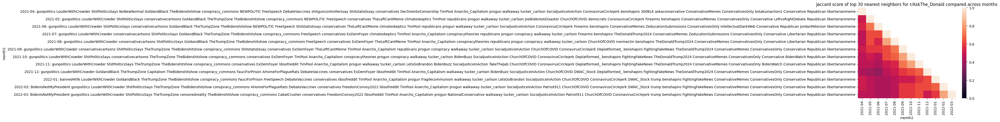

30 nearest neightbors of r/running


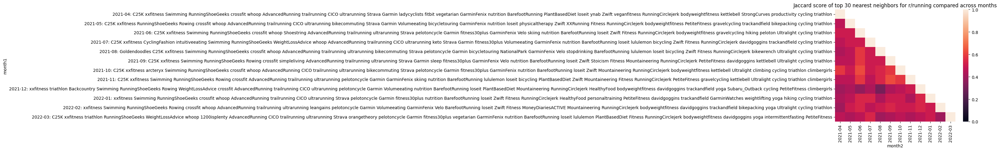

30 nearest neightbors of r/teenagers


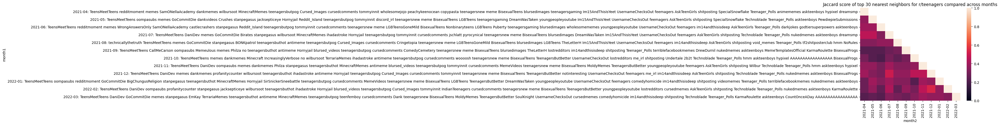

30 nearest neightbors of r/LeopardsAteMyFace


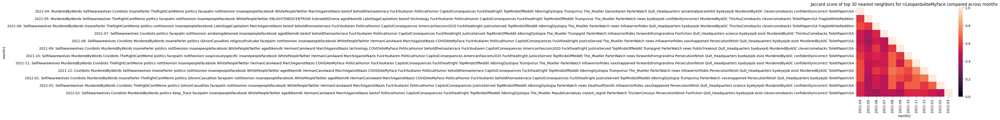

30 nearest neightbors of r/GME


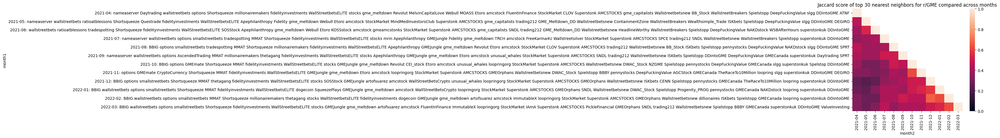

<Figure size 640x480 with 0 Axes>

In [3]:
def get_jaccard_index(set1, set2):
    intersection_size = len(set1.intersection(set2))
    if intersection_size == 0: 
        return 0
    union_size = len(set1.union(set2))
    return intersection_size / union_size


# Let's look at some specific subreddits
interesting_subreddits = ["trans", "antiwork", "WorkReform", "AskReddit", "IdiotsInCars", "wallstreetbets", "vaxxhappened", "PublicFreakout", "ActualPublicFreakouts", "TheRedPill", "dating_advice", "democrats", "Conservative", "conservatives", "AskThe_Donald", "running", "teenagers", "LeopardsAteMyFace", "GME"]


for n in [10, 20, 30]:
    for subreddit in interesting_subreddits:
        subreddit_comp_results = list()
        print(f"{n} nearest neightbors of r/{subreddit}")
        tick_labels = list()
        for i, month1_label in enumerate(MONTHS):
            c2v_model = C2V_MODELS[i]
            topn_nn = set(c2v_model.get_nearest_neighbors(subreddit, n))
            subreddit_comp_results.append((month1_label, topn_nn))
            tick_labels.append(month1_label + ": " + " ".join(topn_nn))

        subreddit_comp_df = pd.DataFrame.from_records(subreddit_comp_results, columns=["month1", "month1_subreddits"])
        subreddit_comp_df_right = subreddit_comp_df.copy().rename(columns={"month1": "month2", "month1_subreddits": "month2_subreddits"})
        merged = pd.merge(subreddit_comp_df, subreddit_comp_df_right, how="cross")
        
        merged["jaccard_score"] = merged.apply(lambda x: get_jaccard_index(x["month1_subreddits"], x["month2_subreddits"]), axis=1)
        pivot_table = merged.pivot(index = "month1", columns = "month2", values = "jaccard_score")
        mask = np.triu(np.ones_like(pivot_table, dtype=bool), 1)
        heatmap = sns.heatmap(pivot_table, vmin=0, vmax=1, yticklabels= tick_labels, mask = mask).set_title(f"Jaccard score of top {n} nearest neighbors for r/{subreddit} compared across months")
        fig = heatmap.get_figure()
        plt.show()
        fig.savefig(VIZ_PATH / f"{n}_{subreddit}.png", bbox_inches="tight")
        plt.clf()


        